In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import warnings

In [2]:
df=pd.read_csv('solarpowergeneration.csv')
df.head()

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated
0,0.859897,69,28,7.5,0,10.0,75,8.0,29.82,0
1,0.628535,69,28,7.5,0,10.0,77,5.0,29.85,0
2,0.397172,69,28,7.5,0,10.0,70,0.0,29.89,5418
3,0.165810,69,28,7.5,0,10.0,33,0.0,29.91,25477
4,0.065553,69,28,7.5,0,10.0,21,3.0,29.89,30069


In [3]:
df.shape

(2920, 10)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   distance-to-solar-noon       2920 non-null   float64
 1   temperature                  2920 non-null   int64  
 2   wind-direction               2920 non-null   int64  
 3   wind-speed                   2920 non-null   float64
 4   sky-cover                    2920 non-null   int64  
 5   visibility                   2920 non-null   float64
 6   humidity                     2920 non-null   int64  
 7   average-wind-speed-(period)  2919 non-null   float64
 8   average-pressure-(period)    2920 non-null   float64
 9   power-generated              2920 non-null   int64  
dtypes: float64(5), int64(5)
memory usage: 228.3 KB


## **Exploratory Data Analysis (EDA)**

## **1) Data Cleaning**

# A) Handling Missing Values

In [8]:
missing_values = df.isnull().sum()
print(missing_values)

distance-to-solar-noon         0
temperature                    0
wind-direction                 0
wind-speed                     0
sky-cover                      0
visibility                     0
humidity                       0
average-wind-speed-(period)    1
average-pressure-(period)      0
power-generated                0
dtype: int64


In [9]:
missing_percentage = (missing_values / len(df)) * 100
print(missing_percentage)

distance-to-solar-noon         0.000000
temperature                    0.000000
wind-direction                 0.000000
wind-speed                     0.000000
sky-cover                      0.000000
visibility                     0.000000
humidity                       0.000000
average-wind-speed-(period)    0.034247
average-pressure-(period)      0.000000
power-generated                0.000000
dtype: float64


<Axes: >

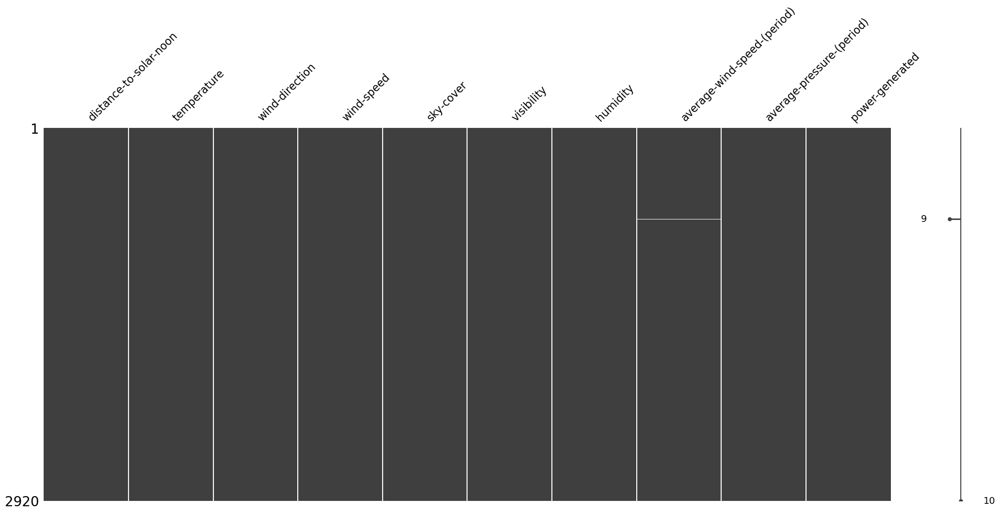

In [10]:
#Visualizing Missing Data
msno.matrix(df)

In [11]:
#There is small percentage of columns and rows having missing data ... so drop that missing row
df_cleaned = df.dropna()

In [12]:
df_cleaned.shape

(2919, 10)

In [13]:
df_cleaned.isnull().sum()

distance-to-solar-noon         0
temperature                    0
wind-direction                 0
wind-speed                     0
sky-cover                      0
visibility                     0
humidity                       0
average-wind-speed-(period)    0
average-pressure-(period)      0
power-generated                0
dtype: int64

In [14]:
df.describe()

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated
count,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2919.000000,2920.000000,2920.000000
mean,0.503294,58.468493,24.953425,10.096986,1.987671,9.557705,73.513699,10.129154,30.017760,6979.846233
std,0.298024,6.841200,6.915178,4.838185,1.411978,1.383884,15.077139,7.261547,0.142006,10312.336413
min,0.050401,42.000000,1.000000,1.100000,0.000000,0.000000,14.000000,0.000000,29.480000,0.000000
25%,0.243714,53.000000,25.000000,6.600000,1.000000,10.000000,65.000000,5.000000,29.920000,0.000000
50%,0.478957,59.000000,27.000000,10.000000,2.000000,10.000000,77.000000,9.000000,30.000000,404.000000
75%,0.739528,63.000000,29.000000,13.100000,3.000000,10.000000,84.000000,15.000000,30.110000,12723.500000
max,1.141361,78.000000,36.000000,26.600000,4.000000,10.000000,100.000000,40.000000,30.530000,36580.000000


In [15]:
df_cleaned.describe()

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated
count,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,0.503327,58.468996,24.957862,10.099486,1.987667,9.559609,73.505995,10.129154,30.017712,6982.182939
std,0.298069,6.842318,6.912203,4.837128,1.412220,1.380290,15.073974,7.261547,0.142006,10313.330078
min,0.050401,42.000000,1.000000,1.100000,0.000000,0.000000,14.000000,0.000000,29.480000,0.000000
25%,0.232061,53.000000,25.000000,6.600000,1.000000,10.000000,65.000000,5.000000,29.920000,0.000000
50%,0.479241,59.000000,27.000000,10.000000,2.000000,10.000000,77.000000,9.000000,30.000000,404.000000
75%,0.739559,63.000000,29.000000,13.100000,3.000000,10.000000,84.000000,15.000000,30.110000,12725.000000
max,1.141361,78.000000,36.000000,26.600000,4.000000,10.000000,100.000000,40.000000,30.530000,36580.000000


# B)Handling Outliers

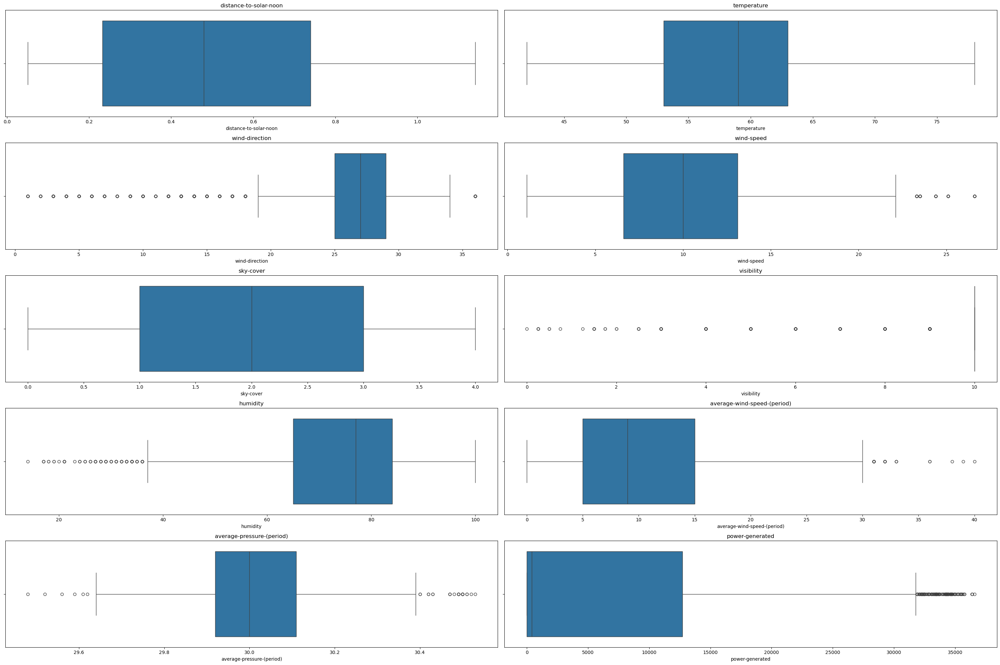

In [17]:
plt.figure(figsize=(30, 20))

n_rows=5
n_cols=2
for i, column in enumerate(df.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df_cleaned, x=column)
    plt.title(column)

plt.tight_layout()
plt.show()

<Figure size 1500x1200 with 0 Axes>

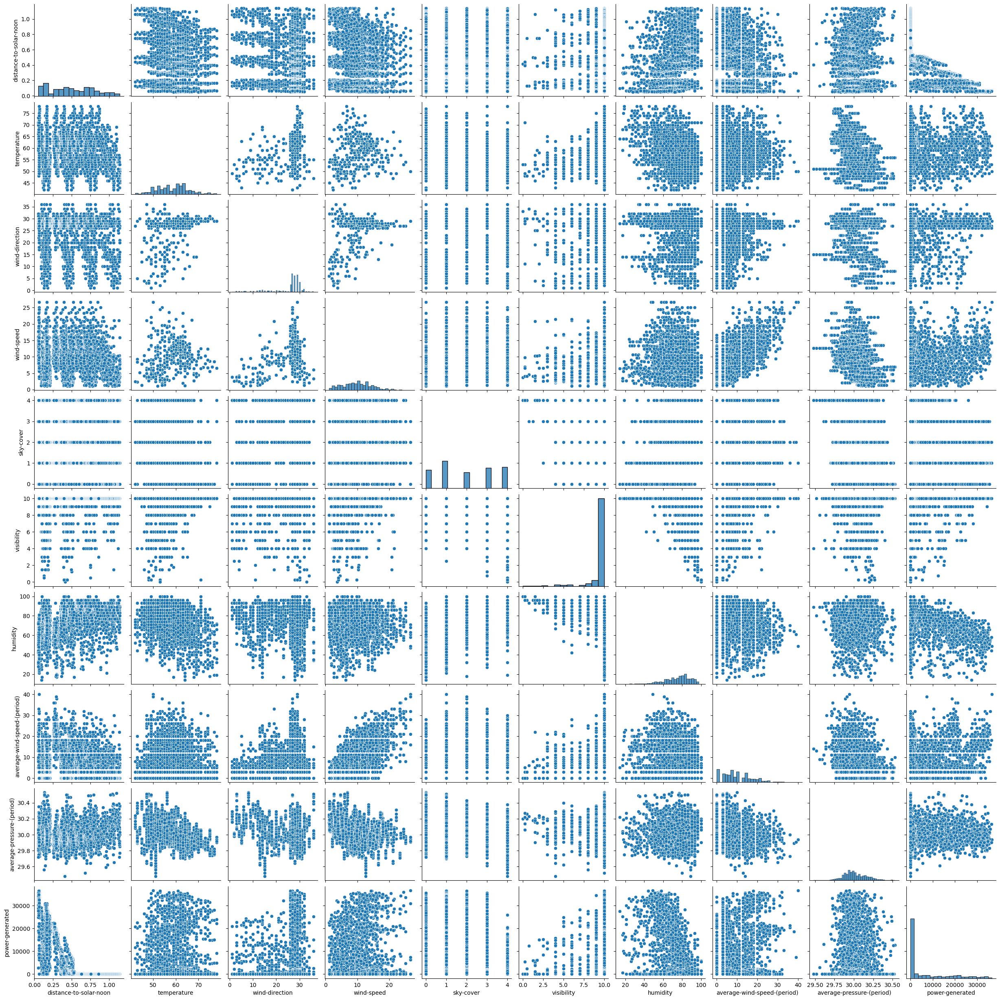

In [18]:
warnings.filterwarnings('ignore')
plt.figure(figsize=(15, 12))
sns.pairplot(df_cleaned)
plt.show()

In [19]:
# Statistical method for identifying outliers
outliers_dict = {}

for column in df_cleaned.columns:
    Q1 = df_cleaned[column].quantile(0.25)
    Q3 = df_cleaned[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df_cleaned[(df_cleaned[column] < lower_bound) | (df_cleaned[column] > upper_bound)]

    if not outliers.empty:
        outliers_dict[column] = outliers

for column, data in outliers_dict.items():
    print(f"Outliers for {column}:")
    print(data)
    print("\n")

for column, data in outliers_dict.items():
    print(f"Total count of outliers for {column}: {len(data)}")
    print("\n")

Outliers for wind-direction:
      distance-to-solar-noon  temperature  wind-direction  wind-speed  \
408                 0.995434           68              14         2.7   
409                 0.721461           68              14         2.7   
410                 0.447489           68              14         2.7   
411                 0.173516           68              14         2.7   
412                 0.100457           68              14         2.7   
...                      ...          ...             ...         ...   
1947                0.153382           60              18        11.0   
1948                0.064010           60              18        11.0   
1949                0.281401           60              18        11.0   
1950                0.498792           60              18        11.0   
1951                0.716184           60              18        11.0   

      sky-cover  visibility  humidity  average-wind-speed-(period)  \
408           0        1

In [20]:
# Calculating skewness for each numeric column
skewness = df_cleaned.select_dtypes(include=['number']).skew()

print("Skewness for each column:")
print(skewness)

Skewness for each column:
distance-to-solar-noon         0.211104
temperature                    0.125680
wind-direction                -1.631854
wind-speed                     0.416894
sky-cover                      0.080279
visibility                    -3.875780
humidity                      -0.956141
average-wind-speed-(period)    0.622910
average-pressure-(period)      0.442221
power-generated                1.306524
dtype: float64


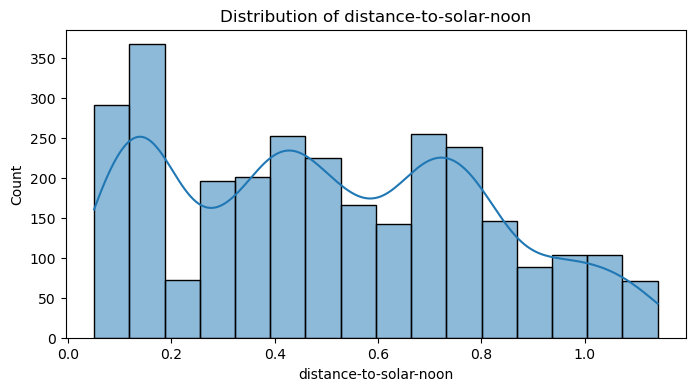

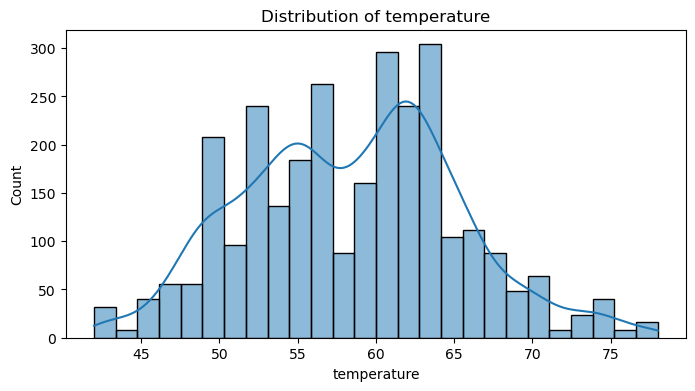

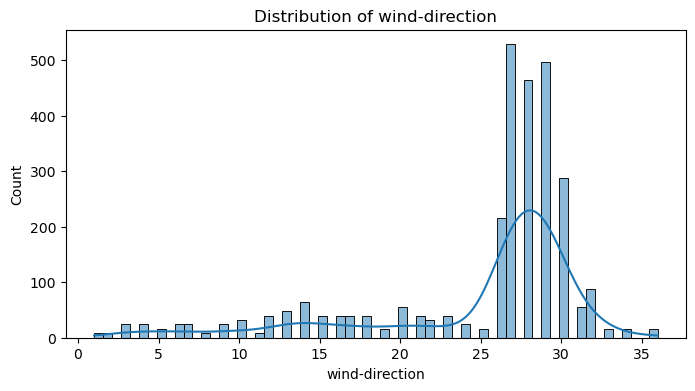

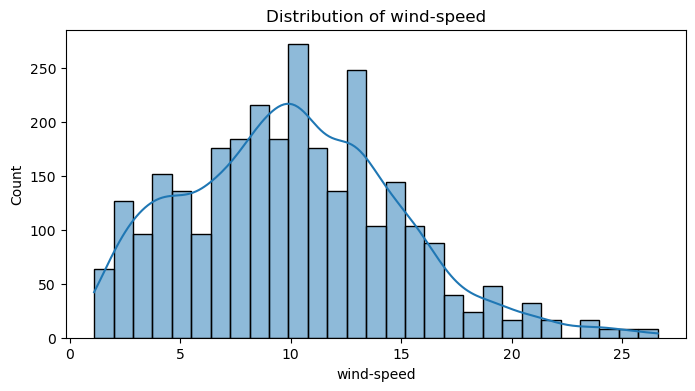

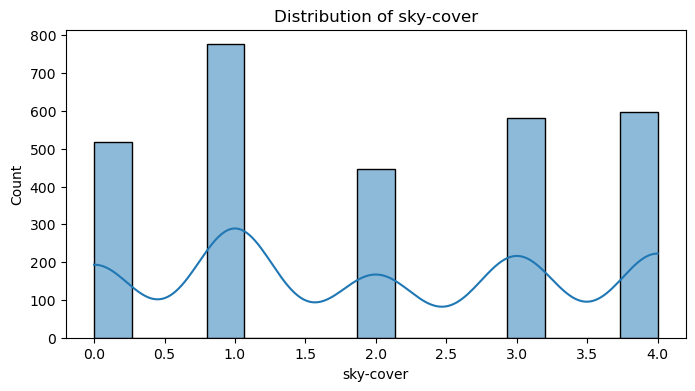

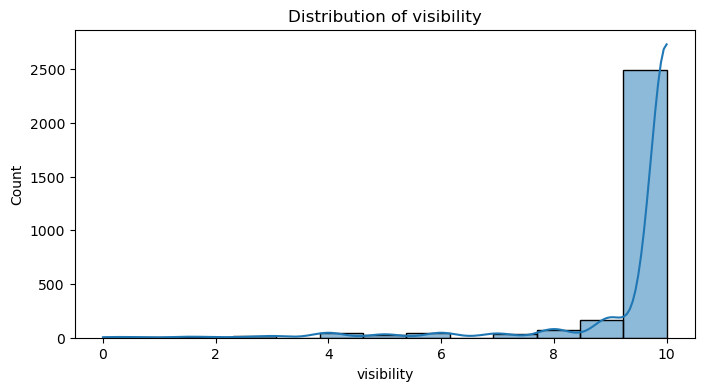

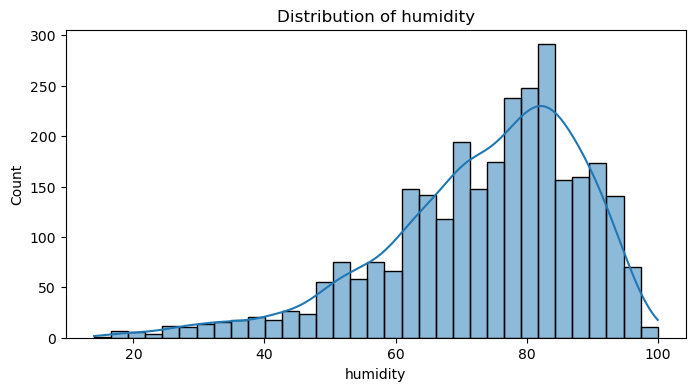

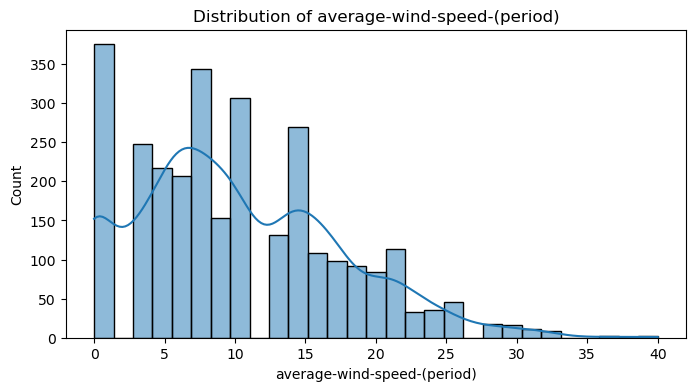

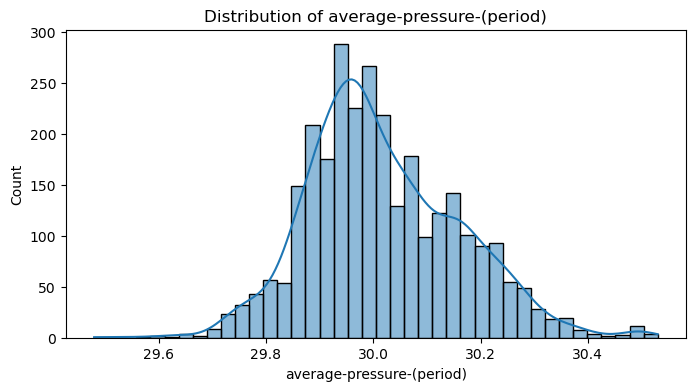

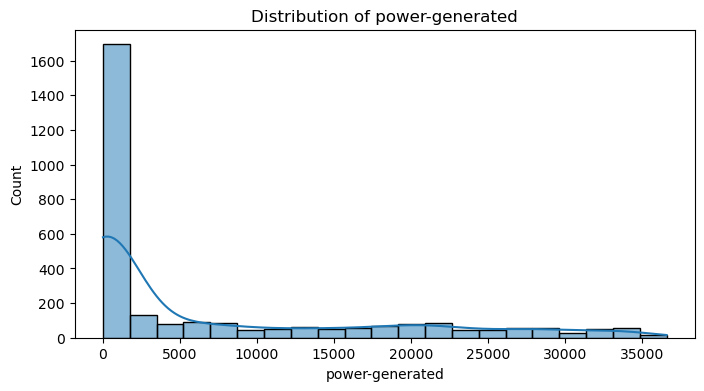

In [21]:
for column in df_cleaned.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_cleaned[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()

In [22]:
'''
we have a mix of highly skewed and moderately skewed columns, and the general robustness of the median to outliers and skewness,
using the median for imputation is a prudent choice. It ensures that the imputation is less affected by extreme values and provides a consistent
approach across all columns.
'''



'\nwe have a mix of highly skewed and moderately skewed columns, and the general robustness of the median to outliers and skewness,\nusing the median for imputation is a prudent choice. It ensures that the imputation is less affected by extreme values and provides a consistent\napproach across all columns.\n'

In [23]:
# Imputing outliers with median for each column
for column in df_cleaned.columns:
    Q1 = df_cleaned[column].quantile(0.25)
    Q3 = df_cleaned[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    median_value = df_cleaned[column].median()
    df_cleaned[column] = df_cleaned[column].apply(
        lambda x: median_value if x < lower_bound or x > upper_bound else x
    )

In [24]:
# Calculating skewness for each numeric column
skewness = df_cleaned.select_dtypes(include=['number']).skew()

print("Skewness for each column:")
print(skewness)

Skewness for each column:
distance-to-solar-noon         0.211104
temperature                    0.125680
wind-direction                -1.036684
wind-speed                     0.183035
sky-cover                      0.080279
visibility                     0.000000
humidity                      -0.594888
average-wind-speed-(period)    0.487534
average-pressure-(period)      0.331405
power-generated                1.410823
dtype: float64


In [25]:
df.describe()

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated
count,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2919.000000,2920.000000,2920.000000
mean,0.503294,58.468493,24.953425,10.096986,1.987671,9.557705,73.513699,10.129154,30.017760,6979.846233
std,0.298024,6.841200,6.915178,4.838185,1.411978,1.383884,15.077139,7.261547,0.142006,10312.336413
min,0.050401,42.000000,1.000000,1.100000,0.000000,0.000000,14.000000,0.000000,29.480000,0.000000
25%,0.243714,53.000000,25.000000,6.600000,1.000000,10.000000,65.000000,5.000000,29.920000,0.000000
50%,0.478957,59.000000,27.000000,10.000000,2.000000,10.000000,77.000000,9.000000,30.000000,404.000000
75%,0.739528,63.000000,29.000000,13.100000,3.000000,10.000000,84.000000,15.000000,30.110000,12723.500000
max,1.141361,78.000000,36.000000,26.600000,4.000000,10.000000,100.000000,40.000000,30.530000,36580.000000


In [26]:
df_cleaned.describe()

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated
count,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.0,2919.000000,2919.000000,2919.000000,2919.000000
mean,0.503327,58.468996,27.613909,9.899692,1.987667,10.0,74.877355,9.924974,30.014529,5760.816033
std,0.298069,6.842318,2.307709,4.523708,1.412220,0.0,12.956088,6.944028,0.133847,8954.881377
min,0.050401,42.000000,19.000000,1.100000,0.000000,10.0,37.000000,0.000000,29.640000,0.000000
25%,0.232061,53.000000,27.000000,6.600000,1.000000,10.0,67.000000,5.000000,29.920000,0.000000
50%,0.479241,59.000000,27.000000,10.000000,2.000000,10.0,77.000000,9.000000,30.000000,404.000000
75%,0.739559,63.000000,29.000000,13.000000,3.000000,10.0,84.000000,15.000000,30.100000,8804.000000
max,1.141361,78.000000,34.000000,22.100000,4.000000,10.0,100.000000,30.000000,30.390000,31772.000000


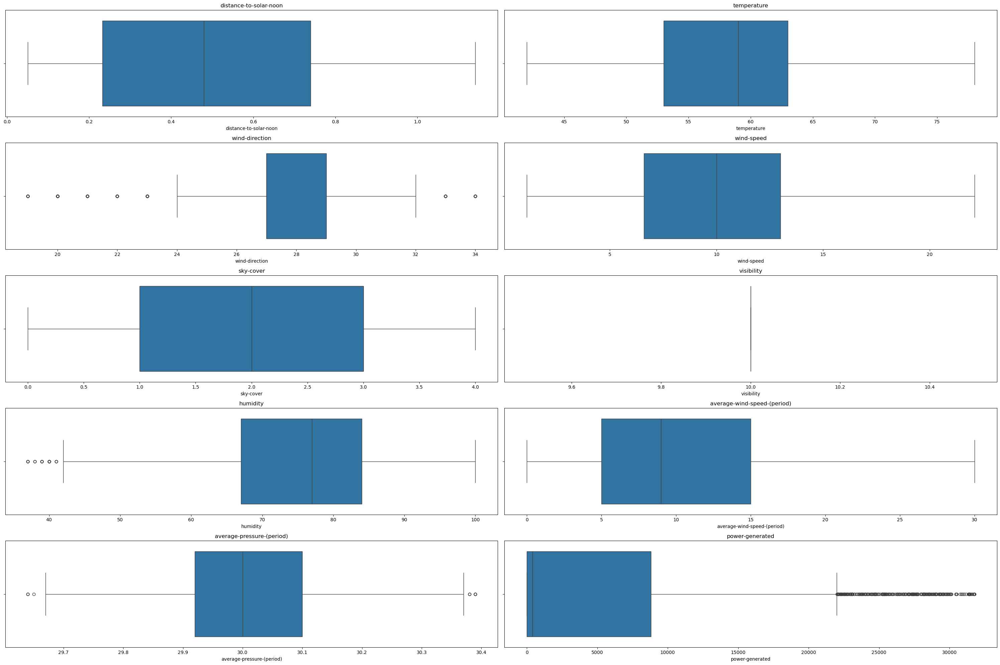

In [27]:
plt.figure(figsize=(30, 20))

n_rows=5
n_cols=2
for i, column in enumerate(df.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df_cleaned, x=column)
    plt.title(column)

plt.tight_layout()
plt.show()

In [28]:
#the outliers have been handled appropriately and that the data distribution looks more normal.

# C) Visualization

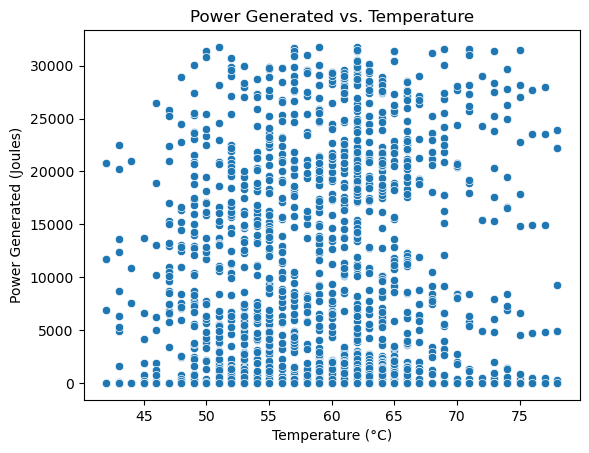

In [30]:
sns.scatterplot(x='temperature', y='power-generated', data=df_cleaned)
plt.title('Power Generated vs. Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('Power Generated (Joules)')
plt.show()

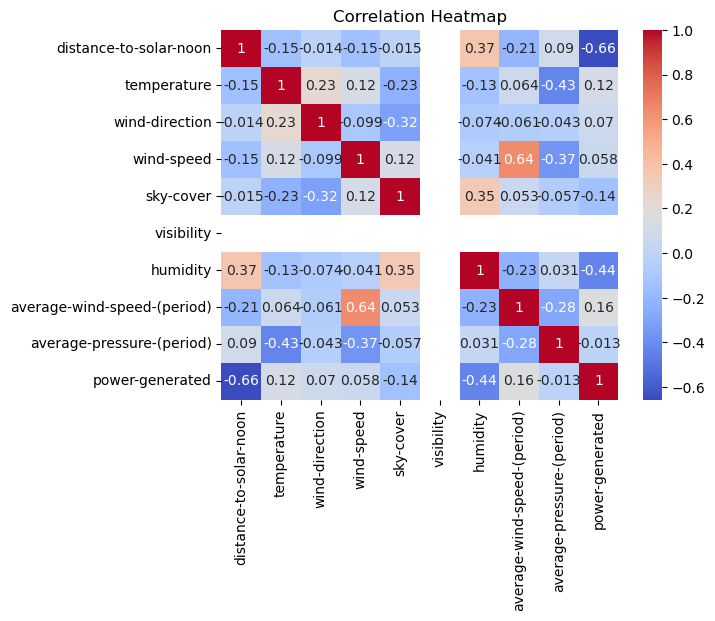

In [31]:
corr_matrix = df_cleaned.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

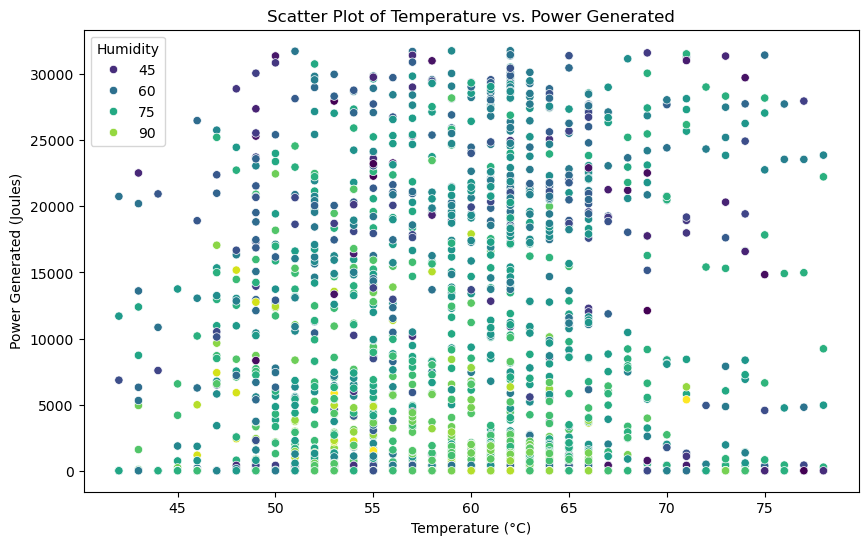

In [32]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='temperature', y='power-generated', hue='humidity', palette='viridis', data=df_cleaned)
plt.title('Scatter Plot of Temperature vs. Power Generated')
plt.xlabel('Temperature (°C)')
plt.ylabel('Power Generated (Joules)')
plt.legend(title='Humidity')
plt.show()

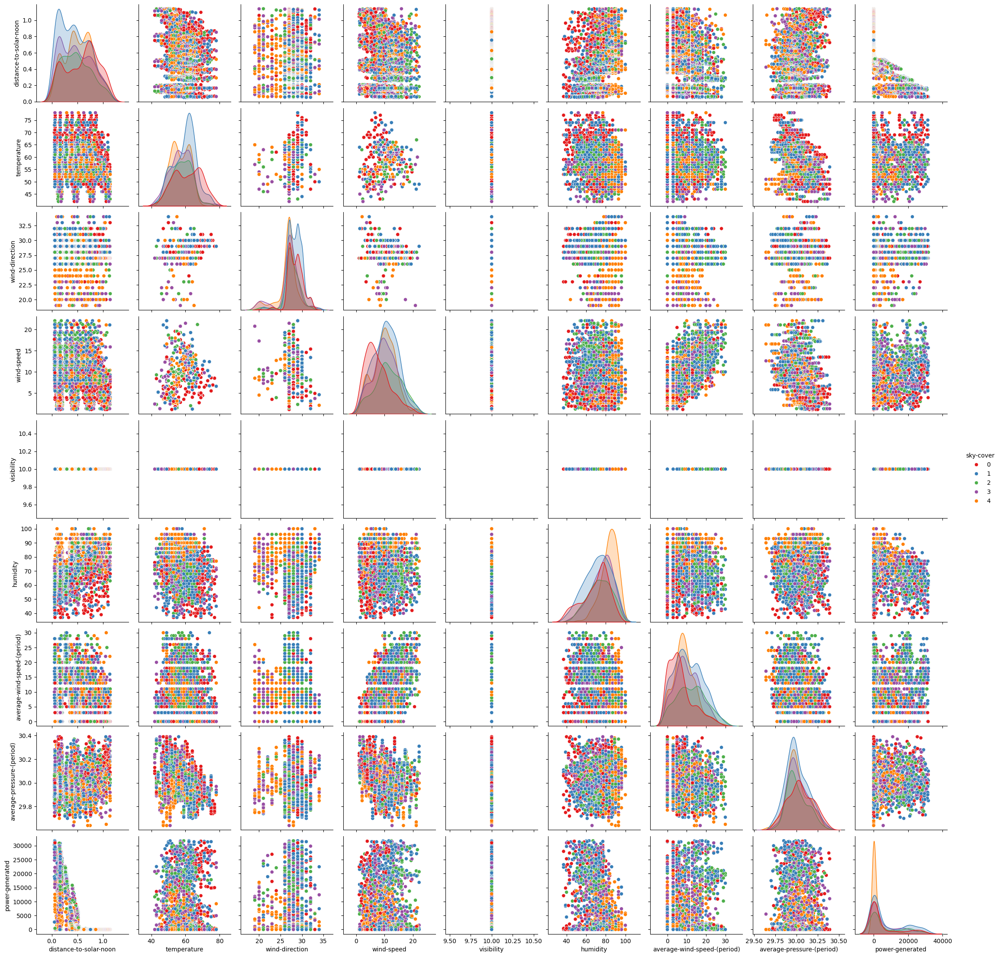

In [33]:
sns.pairplot(df_cleaned, hue='sky-cover', palette='Set1')
plt.show()

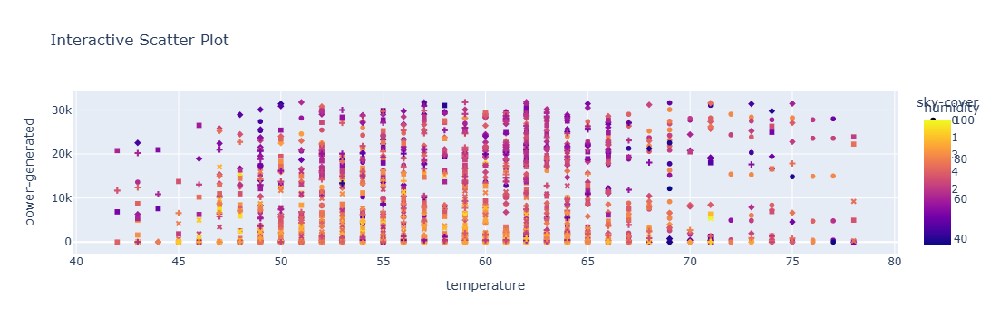

In [34]:
import plotly.express as px

fig = px.scatter(df_cleaned, x='temperature', y='power-generated', color='humidity', symbol='sky-cover', title='Interactive Scatter Plot')
fig.show()

## **2) Feature Engineering**

In [36]:
df_cleaned.columns

Index(['distance-to-solar-noon', 'temperature', 'wind-direction', 'wind-speed',
       'sky-cover', 'visibility', 'humidity', 'average-wind-speed-(period)',
       'average-pressure-(period)', 'power-generated'],
      dtype='object')

In [37]:
# Calculating U and V components
df_cleaned['U_component'] = df_cleaned['wind-speed'] * np.sin(np.radians(df_cleaned['wind-direction']))
df_cleaned['V_component'] = df_cleaned['wind-speed'] * np.cos(np.radians(df_cleaned['wind-direction']))

# Calculating the Wind Power Index
df_cleaned['Wind_Power_Index'] = np.sqrt(df_cleaned['U_component']**2 + df_cleaned['V_component']**2)

scaler = MinMaxScaler()
df_cleaned['Wind_Power_Index'] = scaler.fit_transform(df_cleaned[['Wind_Power_Index']])

df_cleaned

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated,U_component,V_component,Wind_Power_Index
0,0.859897,69,28.0,7.5,0,10.0,75.0,8.0,29.82,0.0,3.521037,6.622107,0.304762
1,0.628535,69,28.0,7.5,0,10.0,77.0,5.0,29.85,0.0,3.521037,6.622107,0.304762
2,0.397172,69,28.0,7.5,0,10.0,70.0,0.0,29.89,5418.0,3.521037,6.622107,0.304762
3,0.165810,69,28.0,7.5,0,10.0,77.0,0.0,29.91,25477.0,3.521037,6.622107,0.304762
4,0.065553,69,28.0,7.5,0,10.0,77.0,3.0,29.89,30069.0,3.521037,6.622107,0.304762
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.166453,63,27.0,13.9,4,10.0,75.0,10.0,29.93,6995.0,6.310468,12.384991,0.609524
2916,0.064020,63,27.0,13.9,1,10.0,66.0,15.0,29.91,29490.0,6.310468,12.384991,0.609524
2917,0.294494,63,27.0,13.9,2,10.0,68.0,21.0,29.88,17257.0,6.310468,12.384991,0.609524
2918,0.524968,63,27.0,13.9,2,10.0,81.0,17.0,29.87,677.0,6.310468,12.384991,0.609524


In [38]:
#Time Based Features
#the function to categorize periods based on distance-to-solar-noon
def categorize_solar_noon_period(distance):
    if distance >= 0.75:
        return 'Early Morning'
    elif 0.5 <= distance < 0.75:
        return 'Morning'
    elif 0.25 <= distance < 0.5:
        return 'Noon'
    elif 0.1 <= distance < 0.25:
        return 'Afternoon'
    else:
        return 'Evening'

# Applying the categorization to the DataFrame
df_cleaned['solar_noon_period'] = df_cleaned['distance-to-solar-noon'].apply(categorize_solar_noon_period)
df_cleaned[['distance-to-solar-noon', 'solar_noon_period']].head()

,distance-to-solar-noon,solar_noon_period
0,0.859897,Early Morning
1,0.628535,Morning
2,0.397172,Noon
3,0.165810,Afternoon
4,0.065553,Evening


In [39]:
df_cleaned

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated,U_component,V_component,Wind_Power_Index,solar_noon_period
0,0.859897,69,28.0,7.5,0,10.0,75.0,8.0,29.82,0.0,3.521037,6.622107,0.304762,Early Morning
1,0.628535,69,28.0,7.5,0,10.0,77.0,5.0,29.85,0.0,3.521037,6.622107,0.304762,Morning
2,0.397172,69,28.0,7.5,0,10.0,70.0,0.0,29.89,5418.0,3.521037,6.622107,0.304762,Noon
3,0.165810,69,28.0,7.5,0,10.0,77.0,0.0,29.91,25477.0,3.521037,6.622107,0.304762,Afternoon
4,0.065553,69,28.0,7.5,0,10.0,77.0,3.0,29.89,30069.0,3.521037,6.622107,0.304762,Evening
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.166453,63,27.0,13.9,4,10.0,75.0,10.0,29.93,6995.0,6.310468,12.384991,0.609524,Afternoon
2916,0.064020,63,27.0,13.9,1,10.0,66.0,15.0,29.91,29490.0,6.310468,12.384991,0.609524,Evening
2917,0.294494,63,27.0,13.9,2,10.0,68.0,21.0,29.88,17257.0,6.310468,12.384991,0.609524,Noon
2918,0.524968,63,27.0,13.9,2,10.0,81.0,17.0,29.87,677.0,6.310468,12.384991,0.609524,Morning


In [40]:
# Create interaction terms
df_cleaned['temperature_humidity_interaction'] = df_cleaned['temperature'] * df_cleaned['humidity']
df_cleaned['wind_speed_sky_cover_interaction'] = df_cleaned['wind-speed'] * df_cleaned['sky-cover']
df_cleaned[['temperature', 'humidity', 'temperature_humidity_interaction',
    'wind-speed', 'sky-cover', 'wind_speed_sky_cover_interaction']]

,temperature,humidity,temperature_humidity_interaction,wind-speed,sky-cover,wind_speed_sky_cover_interaction
0,69,75.0,5175.0,7.5,0,0.0
1,69,77.0,5313.0,7.5,0,0.0
2,69,70.0,4830.0,7.5,0,0.0
3,69,77.0,5313.0,7.5,0,0.0
4,69,77.0,5313.0,7.5,0,0.0
...,...,...,...,...,...,...
2915,63,75.0,4725.0,13.9,4,55.6
2916,63,66.0,4158.0,13.9,1,13.9
2917,63,68.0,4284.0,13.9,2,27.8
2918,63,81.0,5103.0,13.9,2,27.8


In [41]:
# Generate polynomial features
df_cleaned['temperature_squared'] = df_cleaned['temperature'] ** 2
df_cleaned['humidity_squared'] = df_cleaned['humidity'] ** 2
df_cleaned[['temperature', 'temperature_squared', 'humidity', 'humidity_squared']]

,temperature,temperature_squared,humidity,humidity_squared
0,69,4761,75.0,5625.0
1,69,4761,77.0,5929.0
2,69,4761,70.0,4900.0
3,69,4761,77.0,5929.0
4,69,4761,77.0,5929.0
...,...,...,...,...
2915,63,3969,75.0,5625.0
2916,63,3969,66.0,4356.0
2917,63,3969,68.0,4624.0
2918,63,3969,81.0,6561.0


**This feature could be an approximation of solar energy available, possibly combining distance-to-solar-noon, sky-cover, and visibility.**

In [43]:
# Approximate Solar Intensity Index
df_cleaned['solar_intensity_index'] = (1 - df_cleaned['sky-cover'] / 10) * df_cleaned['visibility'] * (1 - df_cleaned['distance-to-solar-noon'])
df_cleaned[['distance-to-solar-noon', 'sky-cover', 'visibility', 'solar_intensity_index']]

,distance-to-solar-noon,sky-cover,visibility,solar_intensity_index
0,0.859897,0,10.0,1.401028
1,0.628535,0,10.0,3.714653
2,0.397172,0,10.0,6.028278
3,0.165810,0,10.0,8.341902
4,0.065553,0,10.0,9.344473
...,...,...,...,...
2915,0.166453,4,10.0,5.001280
2916,0.064020,1,10.0,8.423816
2917,0.294494,2,10.0,5.644046
2918,0.524968,2,10.0,3.800256


**You can create an expected power feature by scaling the solar intensity index:**

In [45]:
# Expected Power Generation (a hypothetical model)
df_cleaned['expected_power_based_on_solar_intensity'] = df_cleaned['solar_intensity_index'] * 1000  # Assuming a scale factor
df_cleaned[['solar_intensity_index', 'expected_power_based_on_solar_intensity']]

,solar_intensity_index,expected_power_based_on_solar_intensity
0,1.401028,1401.028280
1,3.714653,3714.652960
2,6.028278,6028.277630
3,8.341902,8341.902310
4,9.344473,9344.473010
...,...,...
2915,5.001280,5001.280410
2916,8.423816,8423.815617
2917,5.644046,5644.046096
2918,3.800256,3800.256080


**Consider the effect of wind on cooling the panels and improving efficiency:**

In [47]:
# Wind-Adjusted Solar Power
df_cleaned['wind_adjusted_power'] = df_cleaned['expected_power_based_on_solar_intensity'] * (1 + df_cleaned['wind-speed'] / 10)
df_cleaned[['expected_power_based_on_solar_intensity', 'wind-speed', 'wind_adjusted_power']]

,expected_power_based_on_solar_intensity,wind-speed,wind_adjusted_power
0,1401.028280,7.5,2451.799490
1,3714.652960,7.5,6500.642680
2,6028.277630,7.5,10549.485853
3,8341.902310,7.5,14598.329042
4,9344.473010,7.5,16352.827767
...,...,...,...
2915,5001.280410,13.9,11953.060180
2916,8423.815617,13.9,20132.919325
2917,5644.046096,13.9,13489.270169
2918,3800.256080,13.9,9082.612031


**Directly adjusting for sky cover to estimate solar energy:**

In [49]:
# Sky-Cover Adjusted Solar Index
df_cleaned['sky_cover_adjusted_solar_index'] = (1 - df_cleaned['sky-cover'] / 10) * df_cleaned['distance-to-solar-noon']
df_cleaned[['sky-cover', 'distance-to-solar-noon', 'sky_cover_adjusted_solar_index']]

,sky-cover,distance-to-solar-noon,sky_cover_adjusted_solar_index
0,0,0.859897,0.859897
1,0,0.628535,0.628535
2,0,0.397172,0.397172
3,0,0.165810,0.165810
4,0,0.065553,0.065553
...,...,...,...
2915,4,0.166453,0.099872
2916,1,0.064020,0.057618
2917,2,0.294494,0.235595
2918,2,0.524968,0.419974


In [50]:
df_cleaned

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated,...,Wind_Power_Index,solar_noon_period,temperature_humidity_interaction,wind_speed_sky_cover_interaction,temperature_squared,humidity_squared,solar_intensity_index,expected_power_based_on_solar_intensity,wind_adjusted_power,sky_cover_adjusted_solar_index
0,0.859897,69,28.0,7.5,0,10.0,75.0,8.0,29.82,0.0,...,0.304762,Early Morning,5175.0,0.0,4761,5625.0,1.401028,1401.028280,2451.799490,0.859897
1,0.628535,69,28.0,7.5,0,10.0,77.0,5.0,29.85,0.0,...,0.304762,Morning,5313.0,0.0,4761,5929.0,3.714653,3714.652960,6500.642680,0.628535
2,0.397172,69,28.0,7.5,0,10.0,70.0,0.0,29.89,5418.0,...,0.304762,Noon,4830.0,0.0,4761,4900.0,6.028278,6028.277630,10549.485853,0.397172
3,0.165810,69,28.0,7.5,0,10.0,77.0,0.0,29.91,25477.0,...,0.304762,Afternoon,5313.0,0.0,4761,5929.0,8.341902,8341.902310,14598.329042,0.165810
4,0.065553,69,28.0,7.5,0,10.0,77.0,3.0,29.89,30069.0,...,0.304762,Evening,5313.0,0.0,4761,5929.0,9.344473,9344.473010,16352.827767,0.065553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.166453,63,27.0,13.9,4,10.0,75.0,10.0,29.93,6995.0,...,0.609524,Afternoon,4725.0,55.6,3969,5625.0,5.001280,5001.280410,11953.060180,0.099872
2916,0.064020,63,27.0,13.9,1,10.0,66.0,15.0,29.91,29490.0,...,0.609524,Evening,4158.0,13.9,3969,4356.0,8.423816,8423.815617,20132.919325,0.057618
2917,0.294494,63,27.0,13.9,2,10.0,68.0,21.0,29.88,17257.0,...,0.609524,Noon,4284.0,27.8,3969,4624.0,5.644046,5644.046096,13489.270169,0.235595
2918,0.524968,63,27.0,13.9,2,10.0,81.0,17.0,29.87,677.0,...,0.609524,Morning,5103.0,27.8,3969,6561.0,3.800256,3800.256080,9082.612031,0.419974


In [51]:
#Label Encoding (assuming 'solar_noon_period' has an ordinal relationship)
label_encoder = LabelEncoder()
df_cleaned['solar_noon_period_encoded'] = label_encoder.fit_transform(df_cleaned['solar_noon_period'])
df_cleaned[['solar_noon_period', 'solar_noon_period_encoded']]

,solar_noon_period,solar_noon_period_encoded
0,Early Morning,1
1,Morning,3
2,Noon,4
3,Afternoon,0
4,Evening,2
...,...,...
2915,Afternoon,0
2916,Evening,2
2917,Noon,4
2918,Morning,3


In [52]:
df_cleaned.columns

Index(['distance-to-solar-noon', 'temperature', 'wind-direction', 'wind-speed',
       'sky-cover', 'visibility', 'humidity', 'average-wind-speed-(period)',
       'average-pressure-(period)', 'power-generated', 'U_component',
       'V_component', 'Wind_Power_Index', 'solar_noon_period',
       'temperature_humidity_interaction', 'wind_speed_sky_cover_interaction',
       'temperature_squared', 'humidity_squared', 'solar_intensity_index',
       'expected_power_based_on_solar_intensity', 'wind_adjusted_power',
       'sky_cover_adjusted_solar_index', 'solar_noon_period_encoded'],
      dtype='object')

In [53]:
df_cleaned.drop(['V_component','U_component'],axis=1)

,distance-to-solar-noon,temperature,wind-direction,wind-speed,sky-cover,visibility,humidity,average-wind-speed-(period),average-pressure-(period),power-generated,...,solar_noon_period,temperature_humidity_interaction,wind_speed_sky_cover_interaction,temperature_squared,humidity_squared,solar_intensity_index,expected_power_based_on_solar_intensity,wind_adjusted_power,sky_cover_adjusted_solar_index,solar_noon_period_encoded
0,0.859897,69,28.0,7.5,0,10.0,75.0,8.0,29.82,0.0,...,Early Morning,5175.0,0.0,4761,5625.0,1.401028,1401.028280,2451.799490,0.859897,1
1,0.628535,69,28.0,7.5,0,10.0,77.0,5.0,29.85,0.0,...,Morning,5313.0,0.0,4761,5929.0,3.714653,3714.652960,6500.642680,0.628535,3
2,0.397172,69,28.0,7.5,0,10.0,70.0,0.0,29.89,5418.0,...,Noon,4830.0,0.0,4761,4900.0,6.028278,6028.277630,10549.485853,0.397172,4
3,0.165810,69,28.0,7.5,0,10.0,77.0,0.0,29.91,25477.0,...,Afternoon,5313.0,0.0,4761,5929.0,8.341902,8341.902310,14598.329042,0.165810,0
4,0.065553,69,28.0,7.5,0,10.0,77.0,3.0,29.89,30069.0,...,Evening,5313.0,0.0,4761,5929.0,9.344473,9344.473010,16352.827767,0.065553,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.166453,63,27.0,13.9,4,10.0,75.0,10.0,29.93,6995.0,...,Afternoon,4725.0,55.6,3969,5625.0,5.001280,5001.280410,11953.060180,0.099872,0
2916,0.064020,63,27.0,13.9,1,10.0,66.0,15.0,29.91,29490.0,...,Evening,4158.0,13.9,3969,4356.0,8.423816,8423.815617,20132.919325,0.057618,2
2917,0.294494,63,27.0,13.9,2,10.0,68.0,21.0,29.88,17257.0,...,Noon,4284.0,27.8,3969,4624.0,5.644046,5644.046096,13489.270169,0.235595,4
2918,0.524968,63,27.0,13.9,2,10.0,81.0,17.0,29.87,677.0,...,Morning,5103.0,27.8,3969,6561.0,3.800256,3800.256080,9082.612031,0.419974,3


In [54]:
len(df_cleaned.columns)

23

In [55]:
dframe=df_cleaned.drop('solar_noon_period',axis=1)
dframe.info()


<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 2919
Data columns (total 22 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   distance-to-solar-noon                   2919 non-null   float64
 1   temperature                              2919 non-null   int64  
 2   wind-direction                           2919 non-null   float64
 3   wind-speed                               2919 non-null   float64
 4   sky-cover                                2919 non-null   int64  
 5   visibility                               2919 non-null   float64
 6   humidity                                 2919 non-null   float64
 7   average-wind-speed-(period)              2919 non-null   float64
 8   average-pressure-(period)                2919 non-null   float64
 9   power-generated                          2919 non-null   float64
 10  U_component                              2919 non-nul

In [56]:
from sklearn.preprocessing import MinMaxScaler
X = dframe.drop('power-generated', axis=1) 
y = dframe['power-generated']

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [57]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [58]:
#BASELINE MODEL
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Training the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Predicting on test set
y_pred_lr = lr_model.predict(X_test)

# Evaluating the model
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression RMSE: {rmse_lr}")
print(f"Linear Regression R²: {r2_lr}")


Linear Regression RMSE: 6105.020710167602
Linear Regression R²: 0.541191849769213


In [59]:
#Advanced Model - Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

# Training Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# Predicting on test set
y_pred_rf = rf_model.predict(X_test)

# Evaluating the model
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest RMSE: {rmse_rf}")
print(f"Random Forest R²: {r2_rf}")


Random Forest RMSE: 4410.109617804962
Random Forest R²: 0.7605826553141846


In [60]:
#Hyperparameter Tuning - Grid Search on Random Forest
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Initialize Grid Search
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters and model evaluation
best_rf_model = grid_search.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)
rmse_best_rf = mean_squared_error(y_test, y_pred_best_rf, squared=False)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

print(f"Tuned Random Forest RMSE: {rmse_best_rf}")
print(f"Tuned Random Forest R²: {r2_best_rf}")
print(f"Best Parameters: {grid_search.best_params_}")


Tuned Random Forest RMSE: 4419.27828789709
Tuned Random Forest R²: 0.7595861174963939
Best Parameters: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 200}


In [61]:
from xgboost import XGBRegressor
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = xgb_model.predict(X_test)
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost RMSE: {rmse_xgb}")
print(f"XGBoost R²: {r2_xgb}")


XGBoost RMSE: 4383.02047973026
XGBoost R²: 0.7635148683930347


In [62]:
print(f"Linear Regression - RMSE: {rmse_lr}, R²: {r2_lr}")
print(f"Random Forest - RMSE: {rmse_rf}, R²: {r2_rf}")
print(f"Tuned Random Forest - RMSE: {rmse_best_rf}, R²: {r2_best_rf}")
print(f"XGBoost - RMSE: {rmse_xgb}, R²: {r2_xgb}")
best_model = best_rf_model if rmse_best_rf < min(rmse_lr, rmse_rf, rmse_xgb) else (
    rf_model if rmse_rf < min(rmse_lr, rmse_xgb) else (
        xgb_model if rmse_xgb < rmse_lr else lr_model
    )
)
print(f"Selected Best Model: {best_model.__class__.__name__}")

Linear Regression - RMSE: 6105.020710167602, R²: 0.541191849769213
Random Forest - RMSE: 4410.109617804962, R²: 0.7605826553141846
Tuned Random Forest - RMSE: 4419.27828789709, R²: 0.7595861174963939
XGBoost - RMSE: 4383.02047973026, R²: 0.7635148683930347
Selected Best Model: XGBRegressor


In [63]:
import joblib
joblib.dump(best_rf_model, 'best_rf_model.pkl')
print("Model saved successfully.")

Model saved successfully.


In [128]:
pip install streamlit


Note: you may need to restart the kernel to use updated packages.


In [140]:
import streamlit as st
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Load your cleaned data (Assuming it is saved in 'solarpowergeneration.csv')
df_cleaned = pd.read_csv('solarpowergeneration.csv')

# Preprocessing
X = df_cleaned.drop('power-generated', axis=1).values  # Convert DataFrame to NumPy array
y = df_cleaned['power-generated'].values  # Convert target to NumPy array

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Best model from training - XGBoost Regressor
best_model = XGBRegressor(random_state=42)
best_model.fit(X_train, y_train)

# Streamlit Interface
st.title("Solar Power Generation Prediction")

# Create sliders for all input parameters based on the features
temperature = st.slider('Temperature', min_value=float(X[:, 0].min()), max_value=float(X[:, 0].max()), value=float(X[:, 0].mean()))
wind_speed = st.slider('Wind Speed', min_value=float(X[:, 1].min()), max_value=float(X[:, 1].max()), value=float(X[:, 1].mean()))
humidity = st.slider('Humidity', min_value=float(X[:, 2].min()), max_value=float(X[:, 2].max()), value=float(X[:, 2].mean()))
sky_cover = st.slider('Sky Cover', min_value=float(X[:, 3].min()), max_value=float(X[:, 3].max()), value=float(X[:, 3].mean()))
visibility = st.slider('Visibility', min_value=float(X[:, 4].min()), max_value=float(X[:, 4].max()), value=float(X[:, 4].mean()))
avg_wind_speed = st.slider('Average Wind Speed', min_value=float(X[:, 5].min()), max_value=float(X[:, 5].max()), value=float(X[:, 5].mean()))
pressure = st.slider('Pressure', min_value=float(X[:, 6].min()), max_value=float(X[:, 6].max()), value=float(X[:, 6].mean()))
wind_power_index = st.slider('Wind Power Index', min_value=float(X[:, 7].min()), max_value=float(X[:, 7].max()), value=float(X[:, 7].mean()))
solar_intensity_index = st.slider('Solar Intensity Index', min_value=float(X[:, 8].min()), max_value=float(X[:, 8].max()), value=float(X[:, 8].mean()))

# Prepare input for prediction
input_data = np.array([[temperature, wind_speed, humidity, sky_cover, visibility, avg_wind_speed, pressure, wind_power_index, solar_intensity_index]])

# Scale the input data
input_data_scaled = scaler.transform(input_data)

# Prediction
predicted_power = best_model.predict(input_data_scaled)

# Display the prediction
st.subheader(f"Predicted Power Generated: {predicted_power[0]:.2f} kW")

# Display model performance on test set
st.write("### Model Performance on Test Set")
y_pred = best_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
st.write(f"RMSE: {rmse:.2f}")
st.write(f"R²: {r2:.2f}")
